In [68]:
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
from scipy.ndimage import filters
import os


In [406]:
def featureDetect(pic, window = 9, num_points = 256, descriptor_window = 5):
    gray_image = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)
    img = np.copy(gray_image)
    sigma = 3
    imx = np.zeros(img.shape)
    imy = np.zeros(img.shape)
    filters.gaussian_filter(img, (sigma, sigma), (0, 1), imx)
    filters.gaussian_filter(img, (sigma, sigma), (1, 0), imy)

    # compute components of the Harris matrix
    Ixx = filters.gaussian_filter(imx*imx,sigma)
    Ixy = filters.gaussian_filter(imx*imy,sigma)
    Iyy = filters.gaussian_filter(imy*imy,sigma)

    det = Ixx*Iyy - Ixy**2
    trace = Ixx + Iyy
    #R = det / trace
    R = det - 0.05 * trace**2

    offset = window // 2
    R[:offset, :] = 0
    R[-offset:, :] = 0
    R[:, :offset] = 0
    R[:, -offset:] = 0
    local_max = filters.maximum_filter(R, (offset, offset))
    R = R * (R == local_max)
    #print(R)

    sort_idx = np.argsort(R.flatten())[-num_points:]

    x = sort_idx // img.shape[1]
    y = sort_idx % img.shape[1]
    marked_pic = np.copy(pic)
    #print(x, y)
    descriptor = np.array([]).reshape(0, descriptor_window**2)
    for x_, y_ in zip(x, y):
        neighbors = []
        neighbor_offset = descriptor_window // 2
        for i in range(-neighbor_offset, neighbor_offset + 1):
            for j in range(-neighbor_offset, neighbor_offset + 1):
                neighbors.append(img[x_+i, y_+j])
        #print(neighbors)
        descriptor = np.concatenate((descriptor, np.array([neighbors])))
        cv2.circle(marked_pic,(y_, x_), 2, (255,0,0), -1)
    #print(descriptor.shape)
    #plt.imshow(marked_pic)
    #print(np.vstack((x, y)))
    return marked_pic, np.vstack((x, y)).T, descriptor

In [107]:
def readImages(directory):
    images_name = [filename for filename in os.listdir(directory) if filename[-3:] == 'jpg']
    return np.array([cv2.imread(os.path.join(directory, image)) for image in images_name])

In [417]:
def featureMatching(picture1, picture2, descriptors1, descriptors2, indices1, indices2):
    picture = np.concatenate((picture1, picture2), 1)
    #plt.imshow(picture)
    #print(picture.shape, indices1.shape, indices2.shape)
    feature_pairs = []
    for i, descriptor1 in enumerate(descriptors1):
        #print(indices1[i])
        difference = []
        for j, descriptor2 in enumerate(descriptors2):
#            print(np.sum(np.absolute(descriptor1 - descriptor2)))
            difference.append(np.sum(np.absolute(descriptor1 - descriptor2)))
        match_point = np.argsort(difference)[0]
        second_match_point = np.argsort(difference)[1]
        if difference[match_point] < 2600 and difference[second_match_point] - difference[match_point] > 300 :
            #plt.plot([indices1[i][1], indices2[match_point][1]+384], [indices1[i][0], indices2[match_point][0]], 'r-', lw = 0.7)
            start_point = (indices1[i][1], indices1[i][0])
            end_point = (indices2[match_point][1], indices2[match_point][0])
            feature_pairs.append(np.array([np.array(start_point), np.array(end_point)]))
            
            end_point = (indices2[match_point][1]+384, indices2[match_point][0])
            cv2.line(picture, start_point, end_point, (255, 255, 0), 2)
        #print(difference[match_point], difference[second_match_point])
        #print(i, match_point, difference[match_point])
    return picture, np.array(feature_pairs)

In [425]:
from random import randint
def imageMatching(pic1, pic2, feature_pairs):
    h = 512
    w = 384
    shift = feature_pairs[:, 0, :] - feature_pairs[:, 1, :]
    times = 50
    inlier_max = 0
    best_shift = [0, 0]
    for t in range(times):
        sample_pair = randint(0, feature_pairs.shape[0] - 1)
        sample_shift = feature_pairs[sample_pair][0] - feature_pairs[sample_pair][1]
        #print(sample_shift)
        inlier_num = np.sum(np.sum(abs(shift - sample_shift), 1) < 5)
        if inlier_num > inlier_max:
            inlier_max = inlier_num
            best_shift = sample_shift
#    match_image = np.concatenate((pic1, pic2[:, best_shift[0]//2:]), 1)
    vertical_shift = best_shift[1]
    horizontal_shift = best_shift[0]
    match_image_height = abs(vertical_shift) + max(pic1.shape[0], pic2.shape[0])
    left_padding = np.zeros((match_image_height - pic1.shape[0], pic1.shape[1], 3), dtype = np.int8)
    right_padding = np.zeros((match_image_height - pic2.shape[0], pic2.shape[1], 3), dtype = np.int8)

    if vertical_shift > 0:
        left_pic = np.concatenate((pic1, left_padding), axis = 0)
        right_pic = np.concatenate((right_padding, pic2), axis = 0)
    else:
        left_pic = np.concatenate((left_padding, pic1), axis = 0)
        right_pic = np.concatenate((pic2, right_padding), axis = 0)
    #print(left_pic.shape, right_pic.shape)
    match_image = np.concatenate((left_pic, right_pic[:, w - best_shift[0]:]), 1)
    
    #plt.imshow(match_image)
    #print(inlier_max)
    print(best_shift)
    return match_image

(18, 512, 384, 3)
512 768


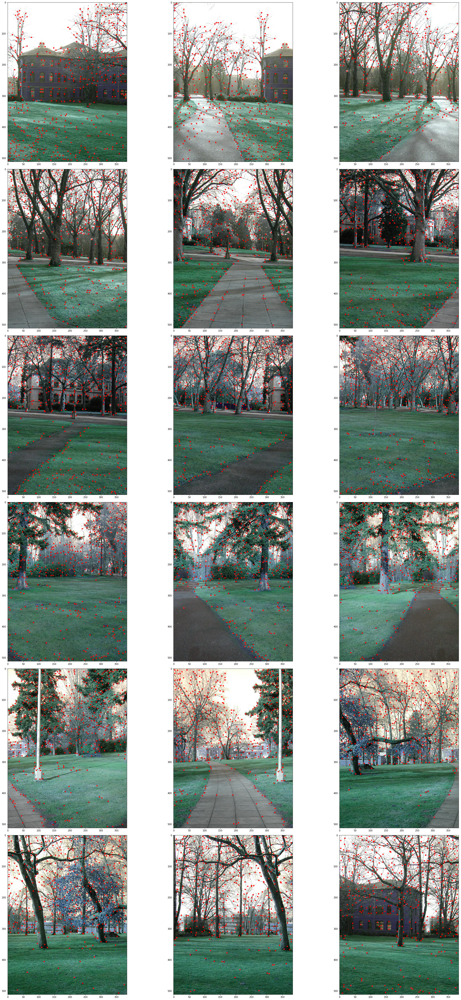

In [407]:
#picture = cv2.imread('parrington/prtn00.jpg')
#print(picture.shape)
images = readImages('parrington/')
print(images.shape)
height = picture.shape[0]
width = picture.shape[1]
#plt.imshow(picture)
print(height, width)
#small_pic = picture[:int(height*0.2), :int(width*0.2)]
#pic = np.copy(picture)
fig, axes = plt.subplots(6, 3, figsize = (30, 60))
fig.tight_layout()
marked_images = []
feature_indicies = []
feature_descriptors = []
for i, pic in enumerate(images):
    marked_img, indicies, descriptor = featureDetect(pic, window = 9, num_points = 512, descriptor_window = 9)
    marked_images.append(marked_img)
    feature_indicies.append(indicies)
    feature_descriptors.append(descriptor)
    r = int(i / 3)
    c = int(i % 3)
    axes[r][c].imshow(marked_img)

plt.show()


[253   5]


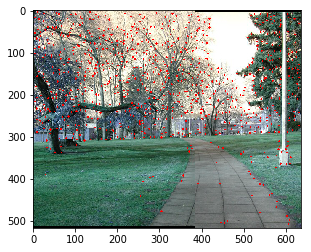

In [435]:
i = 13
match_picture, feature_pairs = featureMatching(marked_images[i+1], marked_images[i], feature_descriptors[i+1], feature_descriptors[i], feature_indicies[i+1], feature_indicies[i])
merged_image = imageMatching(marked_images[i+1], marked_images[i], feature_pairs)
plt.imshow(merged_image)

[250   4]
[248   5]
[244   4]
[253   4]
[244   5]
[255   5]
[245   4]
[250   4]
[248   4]
[243   5]
[252   4]
[249   4]
[243   4]
[253   5]
[248   5]
[245   4]
[256   5]


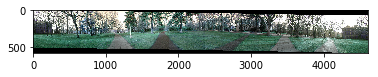

In [432]:
previous_image = images[0]
for i in range(images.shape[0] - 1):
    match_picture, feature_pairs = featureMatching(marked_images[i+1], marked_images[i], feature_descriptors[i+1], feature_descriptors[i], feature_indicies[i+1], feature_indicies[i])
    merged_image = imageMatching(images[i+1], previous_image, feature_pairs)
    previous_image = merged_image
plt.imshow(previous_image)

In [433]:
plt.imsave('panorama.jpg', previous_image.astype(np.uint8))

(512, 768, 3) (256, 2) (256, 2)


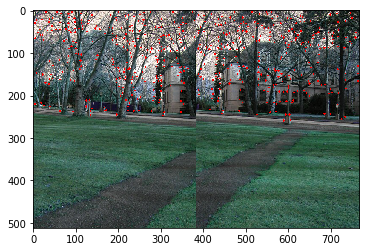

In [383]:
i = 7
match_picture, feature_pairs = featureMatching(marked_images[i], marked_images[i-1], feature_descriptors[i], feature_descriptors[i-1], feature_indicies[i], feature_indicies[i-1])

31 [244   5]


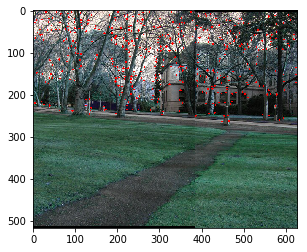

In [384]:
imageMatching(marked_images[i], marked_images[i-1], feature_pairs)

[[ 243    0]
 [ 245    3]
 [ -19  -76]
 [ 243    9]
 [ 243    2]
 [ 246    4]
 [ 246    4]
 [ 244    5]
 [ 245    3]
 [ 246    4]
 [ 246    4]
 [ 245    4]
 [ 246    3]
 [ 246    4]
 [ 243    5]
 [ 245    8]
 [ 246    7]
 [ 245    3]
 [ 246    5]
 [ 246    7]
 [ 246    4]
 [ 246    3]
 [ 244    6]
 [ 245    2]
 [ 244    5]
 [-121   60]
 [  31 -100]
 [ 246    5]
 [ 245    8]
 [ 245    5]
 [ 244    2]
 [ 244    4]
 [ 245    5]
 [ 245    5]
 [ 244    4]
 [ 244    3]]


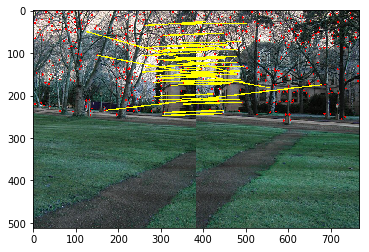

In [385]:
plt.imshow(match_picture)
print(feature_pairs[:, 0, :] - feature_pairs[:, 1, :])


In [302]:
a = np.array([[5, 2], [3, 1], [6, 2], [1, 3]])
print(a)
b = np.array([0, 2])
print(np.sum(abs(a - b), 1))
np.sum(np.sum(abs(a - b), 1) < 6)

[[5 2]
 [3 1]
 [6 2]
 [1 3]]
[5 4 6 2]


3

In [359]:
a = np.array([[[2, 1], [3, 3]]])
b = np.array([[[2, 3]]])

np.concatenate((a, b), 0)

ValueError: all the input array dimensions except for the concatenation axis must match exactly

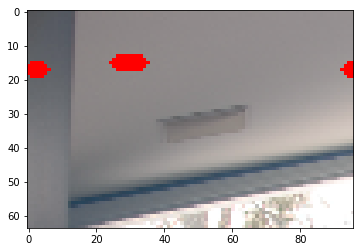

In [234]:
idx = np.argsort(R.flatten())[:50]
x = idx // height
y = idx % height
marked_pic = np.copy(small_pic)
for x_, y_ in zip(x, y):
    #print(x_, y_)
    cv2.circle(marked_pic,(y_, x_), 2, (255,0,0), -1)

plt.imshow(marked_pic)

In [95]:
a = np.array([[1, 2, 3], [2, 3, 5]])
a.flatten()

array([1, 2, 3, 2, 3, 5])

(324, 484, 3)
324 484
315


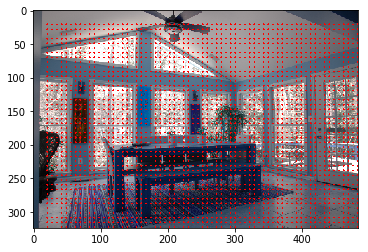

In [ ]:
def gaussian(x, sigma):
    return (1.0 / (2 * np.pi * (sigma ** 2))) * np.exp(- (x ** 2) / (2 * sigma ** 2))

def window_function(x, y, sigma):
    np.exp(-(x**2 + y**2) / 2* sigma**2)

In [67]:
# E(u, v) = Au^2 + Bv^2 + 2Cuv
# A = sum(w * ixx)
# B = sum(w * iyy)
# C = sum(w * ixy)

#compute x and y derivatives of image
gray_image = cv2.cvtColor(picture, cv2.COLOR_BGR2GRAY)
Iy, Ix = np.gradient(gray_image)

#Compute products of derivatives
Ixx = Ix**2
Iyy = Iy**2
Ixy = Ix*Iy
print(Ixx.shape)
#Compute the sums of the products of derivatives at each pixel

k = 0.05 #usually 0.04 - 0.06
kernel_size = 5
offset = kernel_size//2
R_list = []

for i in range(offset, height - offset):
    for j in range(offset, width - offset):
        Sxx = Ixx[i-offset:i+offset+1, j-offset:j+offset+1].sum()
        Syy = Iyy[i-offset:i+offset+1, j-offset:j+offset+1].sum()
        Sxy = Ixy[i-offset:i+offset+1, j-offset:j+offset+1].sum()
        
        det = (Sxx * Syy) - Sxy**2
        trace = Sxx + Syy
        R = det - k * (trace**2)
        R_list.append(R)
        #if R > threshold:
        

(324, 484)


[153415 140159 153592 153598    236  58079 153518 101279 153538 153488
 153214 141600    169    367 153535 153489 153597    167 153148  96480
 153210 153596  99840  98400 153460  31680 104160 153413 153414 121919
  57119 153302 100800 153595 153513    235    229    230 149759 130559
 147359 101760 103679 100320 122399 153351 139679 153519 153299 101280
    368 153504 153582 153584 124319  30240    237  57599 143519 153577
 103200 141120 131519 125279 153583 153505 103680  56639 104159 131039
 153507 123839 123359 153510 153512  98880  31200 153300 102240 153578
 153301  25440 153511 143999  30720 102720 144479 153579 153581 149279
 122879 124799 153580 153599 153509 148799  99360 153508 148319 147839]
[4.20373469e+10 4.21764993e+10 4.22149162e+10 4.22349400e+10
 4.24304129e+10 4.24350839e+10 4.25303518e+10 4.27121121e+10
 4.27556585e+10 4.29291166e+10 4.29581891e+10 4.30834394e+10
 4.30964204e+10 4.31109041e+10 4.34328946e+10 4.34433174e+10
 4.37931148e+10 4.40098957e+10 4.40774258e+10

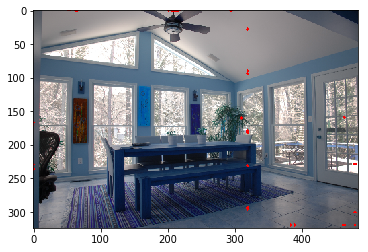

In [96]:
corner_index = np.argsort(R_list)[-100:]
print(corner_index)
print(np.array(R_list)[corner_index])
corner_x = corner_index // (width - 2 * offset)
corner_y = corner_index % (width - 2 * offset)
for (x, y) in zip(corner_x, corner_y):
    #print(x, y)
    marked_picture = cv2.circle(picture,(x,y), 2, (255,0,0), -1)

plt.imshow(marked_picture)